# Visualizing (static) networks in Python

In [1]:
import networkx as nx
import numpy as np
import json
import matplotlib.pyplot as plt

from networkx.readwrite import json_graph

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.rcParams['figure.dpi'] = 100

In [2]:
nx.__version__

'3.2.1'

### Drawing a graph

The `nx.draw` function in NetworkX draws the graph as a simple representation with no node labels or edge labels and using the full Matplotlib figure area and no axis labels by default. 

The `nx.draw` function has several parameters that you can use to customize the appearance of the graph. Here are the main ones:

- `G` (NetworkX graph or list of nodes) – The graph or the nodes to be drawn.

- `pos` (dictionary) – A dictionary with nodes as keys and positions as values. Positions should be sequences of length 2.

- `ax` (Matplotlib Axes object, optional) – Draw the graph in the specified Matplotlib axes.

- `**kwds` (optional keywords) – See below for optional keywords.

The `nx.draw_networkx` function in NetworkX draws the graph with Matplotlib with options for node positions, labeling, titles, and many other drawing features

The `nx.draw_networkx` function has several parameters that you can use to customize the appearance of the graph. Here are the main ones (not exaustive):

- `G` (graph) – A networkx graph.

- `pos` (dictionary, optional) – A dictionary with nodes as keys and positions as values.

- `arrows` (bool, optional, default: `True`) – For directed graphs, if `True`, draw arrowheads.

- `with_labels` (bool, optional, default: `True`) – Set to `True` to draw labels on the nodes.

- `**kwds` (optional keywords) – See below for optional keywords.

The `**kwds` are optional keywords that set different properties of the layout and appearance of the graph:

- `node_size` (scalar or array, optional, default: 300) – Size of nodes.

- `node_color` (color string, or array of floats, optional, default: 'r') – Node color.

- `node_shape` (string, optional, default: 'o') – The shape of the node.

- `edge_color` (color string, or array of floats, optional, default: 'k') – Edge color.

- `style` (string, optional, default: 'solid') – Edge line style (e.g., `'solid'`, `'dashed'`, etc.)

- `width` (float, optional, default: 1.0) – Line width of edges.

- `edge_cmap` (Matplotlib colormap, optional, default: None) – Colormap for mapping intensities of edges.

- `edge_vmin, edge_vmax` (floats, optional, default: None) – Minimum and maximum for edge colormap scaling.

- `font_size` (int, optional, default: 12) – Font size for labels.

- `font_color` (string, optional, default: 'k') – Font color string.

- `font_weight` (string, optional, default: 'normal') – Font weight. Possible values include `'normal'`, `'bold'`, etc.

- `font_family` (string, optional, default: 'sans-serif') – Font family. Possible values include `'serif'`, `'sans-serif'`, `'cursive'`, `'fantasy'`, and `'monospace'`.

- `label` (string, optional) – Label for graph legend.

For more details, you can refer to the [NetworkX documentation](https://networkx.org/documentation/stable/reference/generated/networkx.drawing.nx_pylab.draw_networkx.html).

In [3]:
# read in the graph 
G = json_graph.node_link_graph(json.load(open('data/major_us_cities.json')))

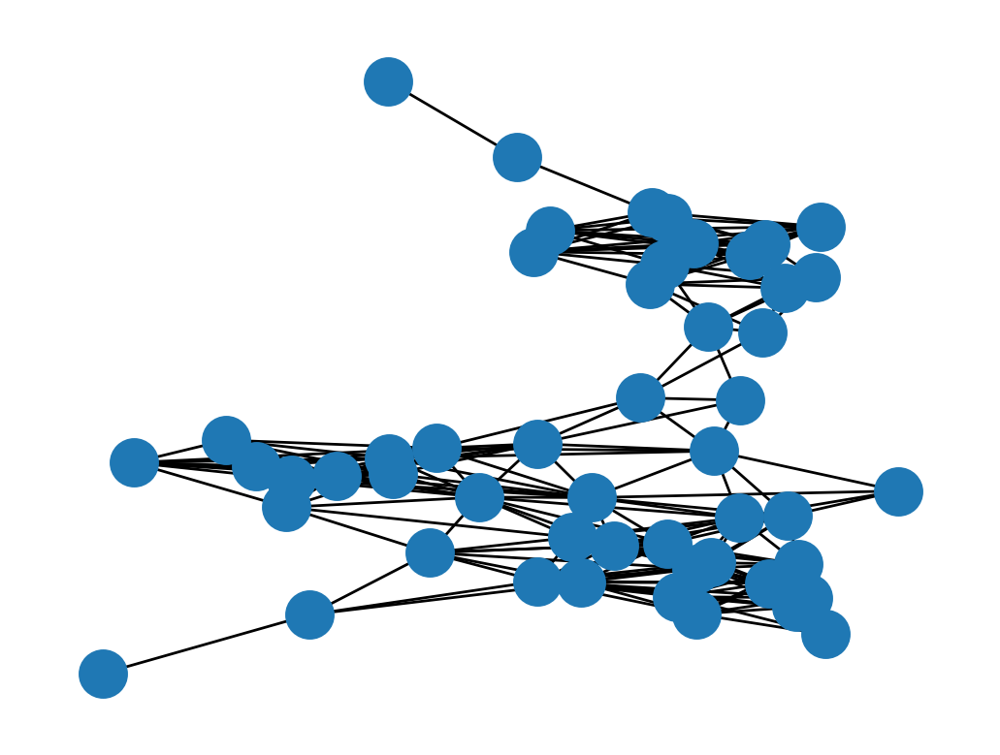

In [4]:
# draw the graph using the default spring layout
fig, ax = plt.subplots()
nx.draw(G, ax=ax)

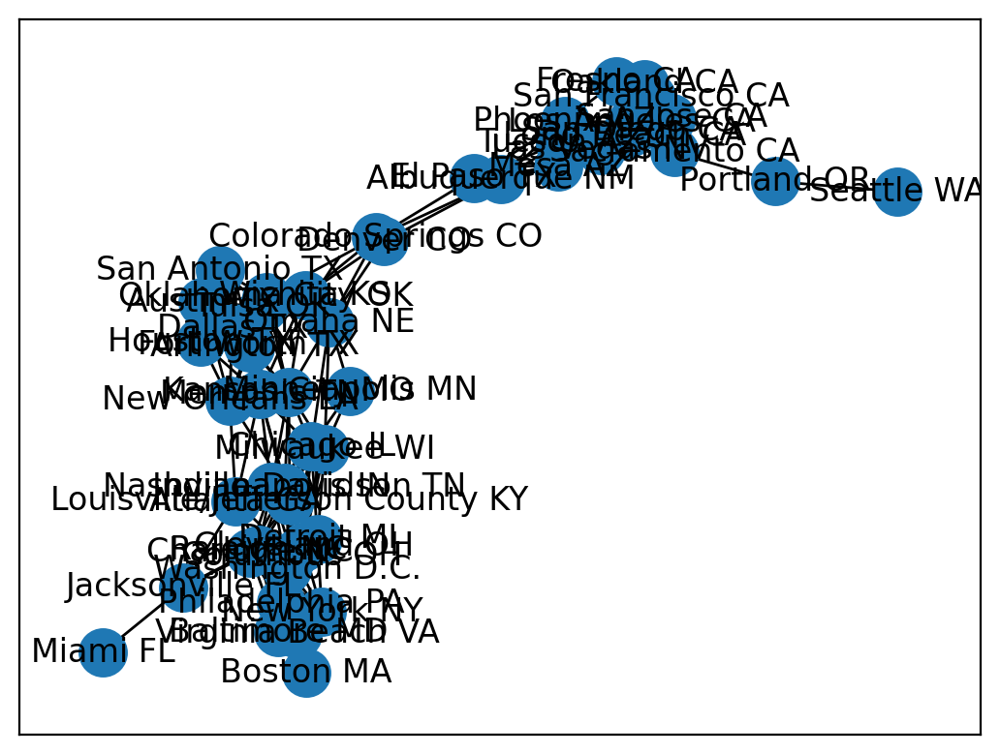

In [5]:
# draw the graph using the default spring layout and draw_networkx
fig, ax = plt.subplots()
nx.draw_networkx(G, ax=ax)

# Graph layouts

Node positioning algorithms for graph drawing.

NetworkX provides several functions to compute node layouts for visualizing graphs. These functions return a dictionary where keys are nodes and values are positions (as 2D or 3D NumPy arrays).

Here are the main layout functions provided by NetworkX:

- `nx.spring_layout(G)`: Position nodes using Fruchterman-Reingold force-directed algorithm. This is the default layout in NetworkX.

- `nx.circular_layout(G)`: Position nodes on a circle.

- `nx.random_layout(G)`: Position nodes uniformly at random in the unit square.

- `nx.shell_layout(G)`: Position nodes in concentric circles.

- `nx.spectral_layout(G)`: Position nodes using the eigenvectors of the graph Laplacian.

- `nx.planar_layout(G)`: Position nodes without edge intersections, if possible (this may not be possible for non-planar graphs).

- `nx.kamada_kawai_layout(G)`: Position nodes using Kamada-Kawai path-length cost-function.

- `nx.multipartite_layout(G)`: Position nodes in layers of straight lines.

- `nx.bipartite_layout(G)`: Position nodes in two straight lines.

Each of these functions has its own set of parameters that you can adjust to customize the layout. For example, `nx.spring_layout(G)` has parameters like `iterations` (the number of iterations of the algorithm to run), `k` (the optimal distance between nodes), and `seed` (the seed for the random number generator).

You can find more information about these functions in the [NetworkX documentation](https://networkx.org/documentation/stable/reference/drawing.html#module-networkx.drawing.layout).

In [6]:
# See what layouts are available in networkX
[x for x in nx.__dir__() if x.endswith('_layout')]

['bipartite_layout',
 'circular_layout',
 'kamada_kawai_layout',
 'random_layout',
 'rescale_layout',
 'shell_layout',
 'spring_layout',
 'spectral_layout',
 'planar_layout',
 'fruchterman_reingold_layout',
 'spiral_layout',
 'multipartite_layout',
 'arf_layout']

In [7]:
# Define common parameters
common_params = dict(node_size=20, width=0.1, node_color='white', edgecolors='black')

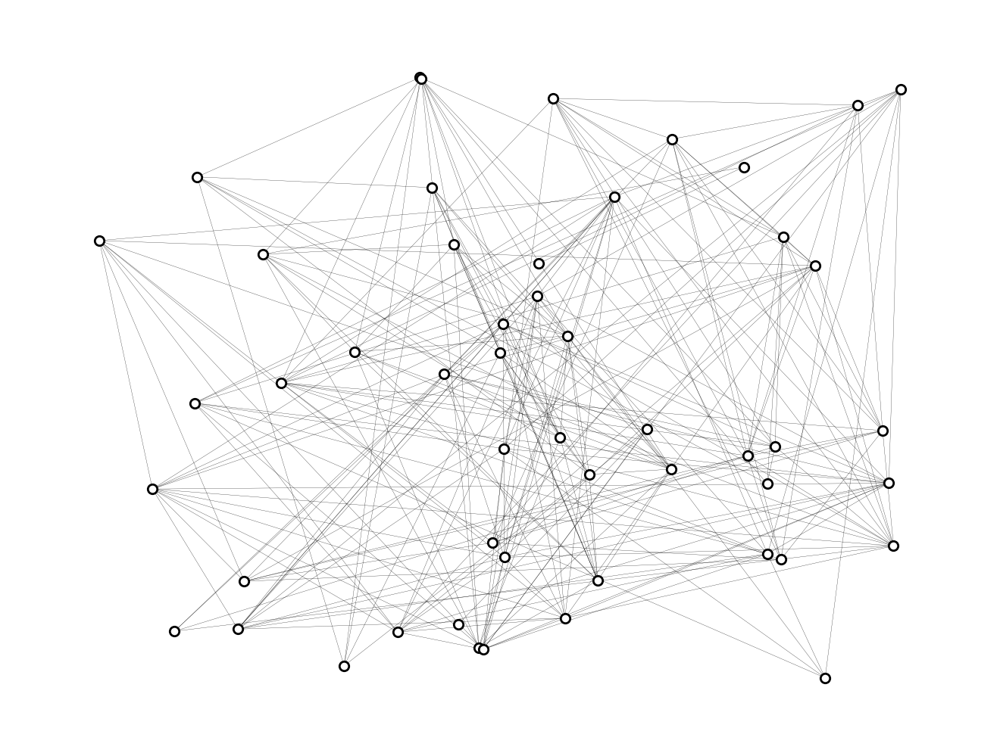

In [8]:
# Draw the graph using the random layout
plt.figure()
pos = nx.random_layout(G)
nx.draw(G, pos, **common_params)

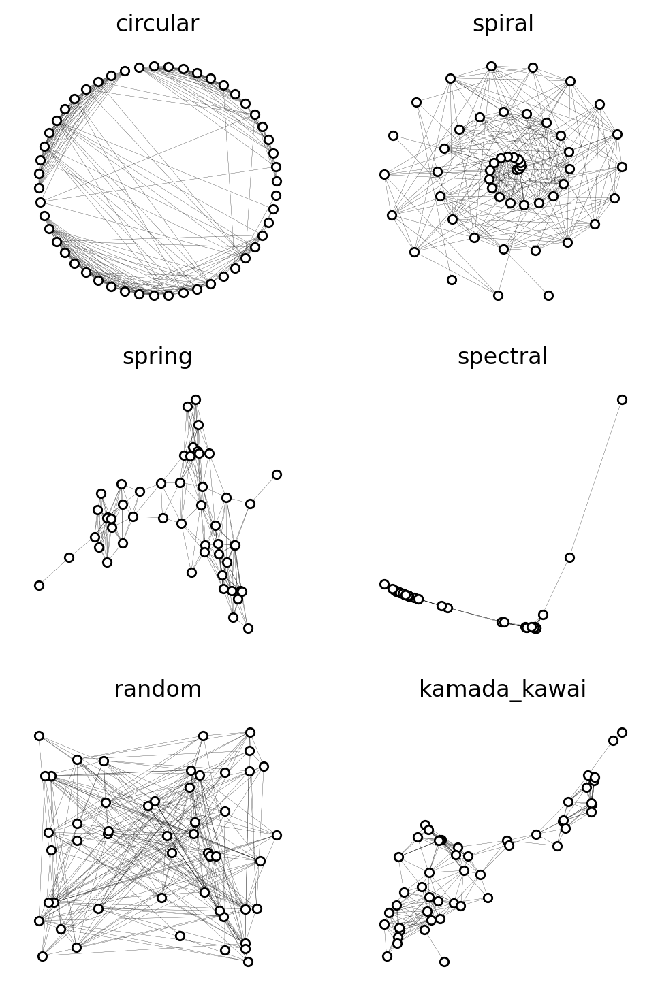

In [9]:
fig, axes = plt.subplots(3, 2, figsize=(6,9))  # Create a 3x3 grid of subplots

axes[0,0].set_title("circular")
axes[1,0].set_title("spring")
axes[2,0].set_title("random")
axes[0,1].set_title("spiral")
axes[1,1].set_title("spectral")
axes[2,1].set_title("kamada_kawai")

nx.draw(G, pos=nx.circular_layout(G), ax=axes[0,0], **common_params)
nx.draw(G, pos=nx.spring_layout(G), ax=axes[1,0], **common_params)
nx.draw(G, pos=nx.random_layout(G), ax=axes[2,0], **common_params)
nx.draw(G, pos=nx.spiral_layout(G), ax=axes[0,1], **common_params)
nx.draw(G, pos=nx.spectral_layout(G), ax=axes[1,1], **common_params)
nx.draw(G, pos=nx.kamada_kawai_layout(G), ax=axes[2,1], **common_params)


# Draw the graph using custom node positions


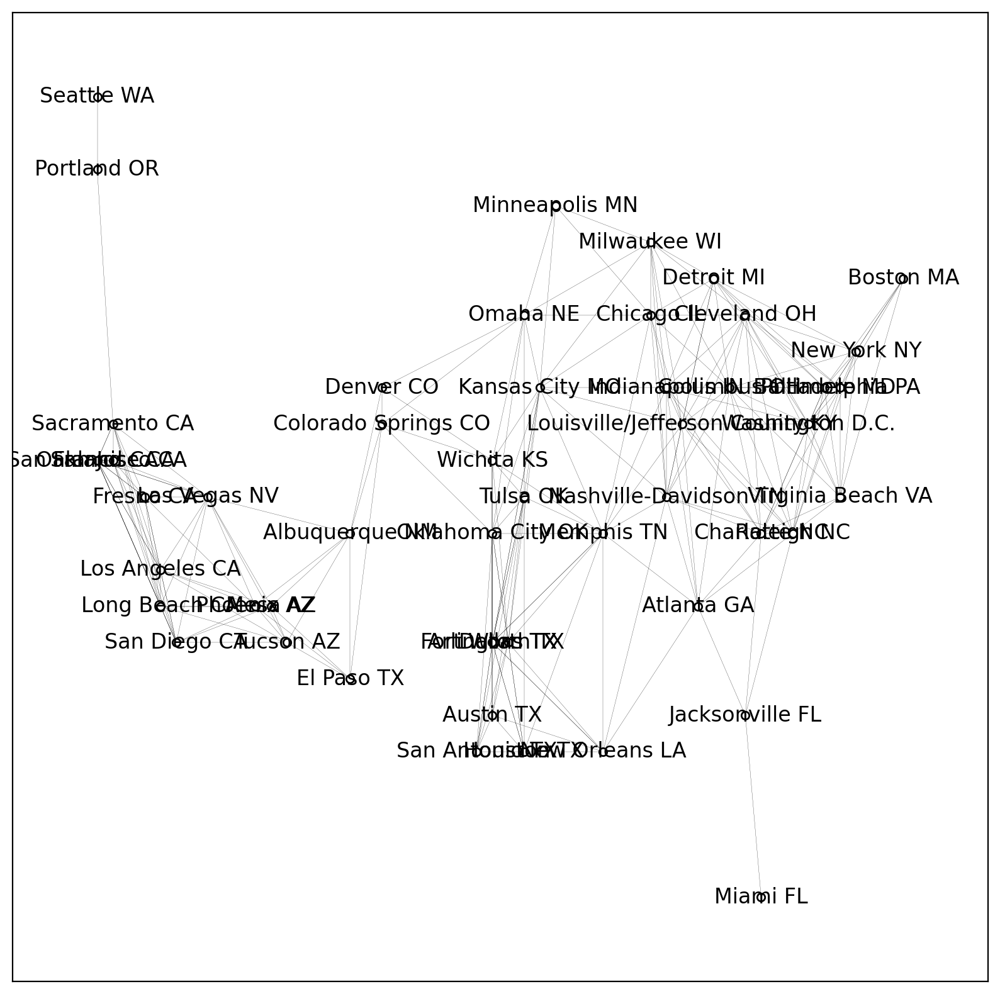

In [10]:
plt.figure(figsize=(10,10))
pos = nx.get_node_attributes(G, 'location')
nx.draw_networkx(G, pos, **common_params)

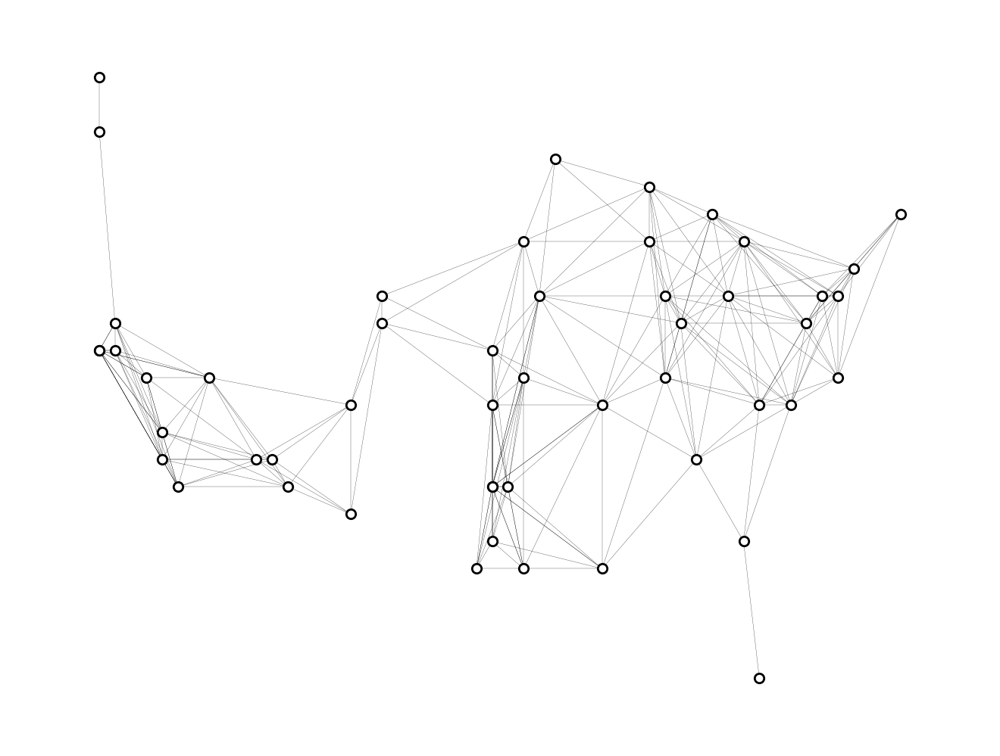

In [11]:
plt.figure()
nx.draw(G, pos, **common_params)

# Data-driven node and edge properties 

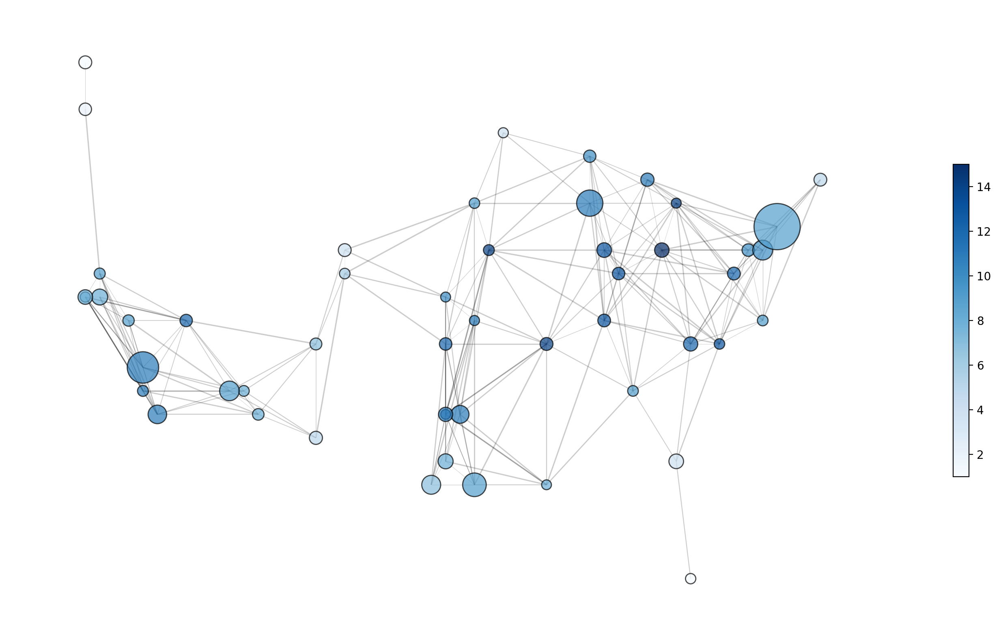

In [12]:
import matplotlib.colors as mcolors

degree_values = [G.degree(v) for v in G]
vmax = max(degree_values)
vmin = min(degree_values)

norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
normv = [norm(current) for current in degree_values]

node_size = [0.0002*nx.get_node_attributes(G, 'population')[v] for v in G]
edge_width = [0.0015*G[u][v]['weight'] for u,v in G.edges()]

cmap = plt.cm.Blues

fig, ax = plt.subplots(figsize=(14,8))
ax.set_axis_off()

nx.draw_networkx_nodes(G, pos, node_size = node_size, node_color=normv, alpha=0.7, edgecolors="black", cmap=cmap, ax=ax)
nx.draw_networkx_edges(G, pos, width=edge_width, alpha=0.2, ax = ax)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)

plt.colorbar(sm, shrink=0.5, ax =ax)
plt.tight_layout()


Draw specific edges and add labels to specific nodes

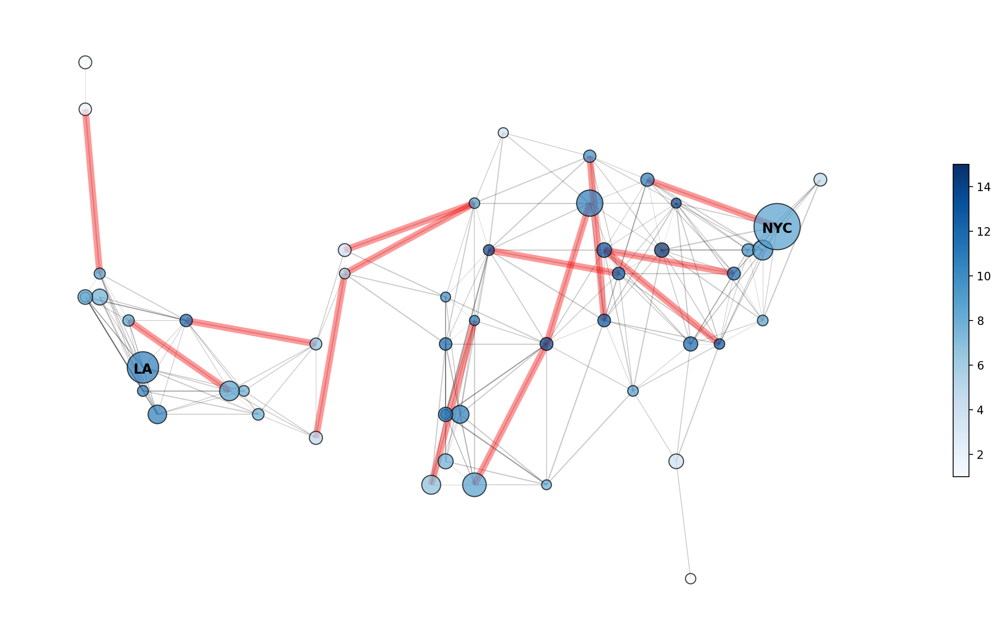

In [13]:
# Draw specific edges and add labels to specific nodes
fig, ax = plt.subplots(figsize=(14,8))
ax.set_axis_off()

nx.draw_networkx_nodes(G, pos, node_size = node_size, node_color=normv, alpha=0.7, edgecolors="black", cmap=cmap, ax=ax)
nx.draw_networkx_edges(G, pos, width=edge_width, alpha=0.2, ax = ax)

greater_than_770 = [x for x in G.edges(data=True) if x[2]['weight']>770]
nx.draw_networkx_edges(G, pos, edgelist=greater_than_770, edge_color='r', alpha=0.4, width=6)

# optional: change the relative position of the labels
label_pos = {node: (x, y-0.1) for node, (x, y) in pos.items()}

nx.draw_networkx_labels(G, label_pos, labels={'Los Angeles CA': 'LA', 'New York NY': 'NYC'}, 
                        font_size=12, font_weight='bold', font_color='black', horizontalalignment='center')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
plt.colorbar(sm, shrink=0.5, ax =ax)
plt.tight_layout()


Add a basemap as a background

In [14]:
import geopandas as gpd

df = gpd.read_file("data/cb_2017_us_nation_5m/cb_2017_us_nation_5m.shp")
df

,AFFGEOID,GEOID,NAME,geometry
0,0100000US,US,United States,"MULTIPOLYGON (((-176.23625 51.82596, -176.2175..."


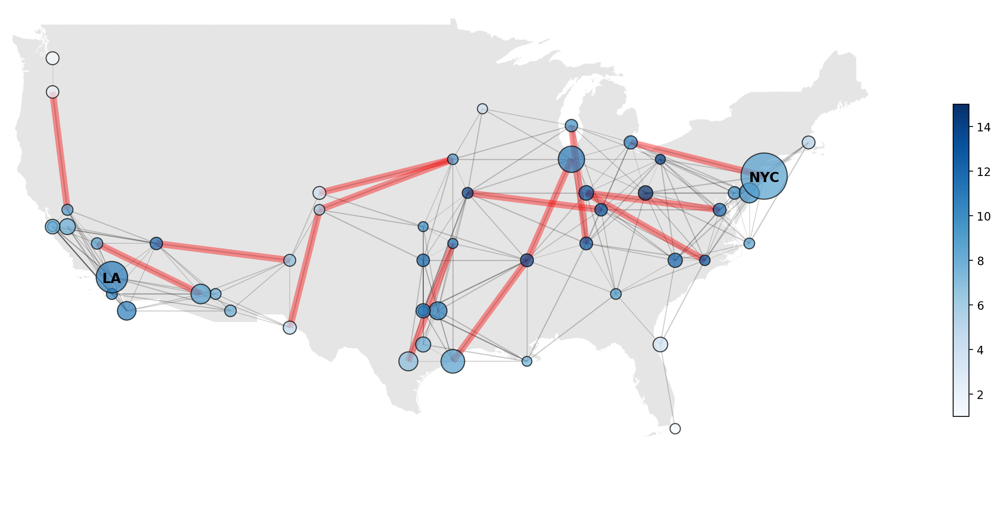

In [15]:
# Add a base map

fig, ax = plt.subplots(figsize=(14,8))
ax.set_xlim([-125, -65])
ax.set_ylim([20, 50])

df.plot(ax=ax, color='gray', alpha=.2)

ax.set_axis_off()

nx.draw_networkx_nodes(G, pos, node_size = node_size, node_color=normv, alpha=0.7, edgecolors="black", cmap=cmap, ax=ax)
nx.draw_networkx_edges(G, pos, width=edge_width, alpha=0.2, ax = ax)

greater_than_770 = [x for x in G.edges(data=True) if x[2]['weight']>770]
nx.draw_networkx_edges(G, pos, edgelist=greater_than_770, edge_color='r', alpha=0.4, width=6)

# optional: change the relative position of the labels
label_pos = {node: (x, y-0.1) for node, (x, y) in pos.items()}

nx.draw_networkx_labels(G, label_pos, labels={'Los Angeles CA': 'LA', 'New York NY': 'NYC'}, 
                        font_size=12, font_weight='bold', font_color='black', horizontalalignment='center')

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
plt.colorbar(sm, shrink=0.5, ax =ax)
plt.tight_layout()


# The Game of Thrones interaction network

In [16]:
import pandas as pd

df = pd.read_csv('data/got/book1.csv')
df.head(2)

,Source,Target,Type,weight,book
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1


In [17]:
GOT = nx.from_pandas_edgelist(df, 'Source', 'Target', edge_attr='weight')

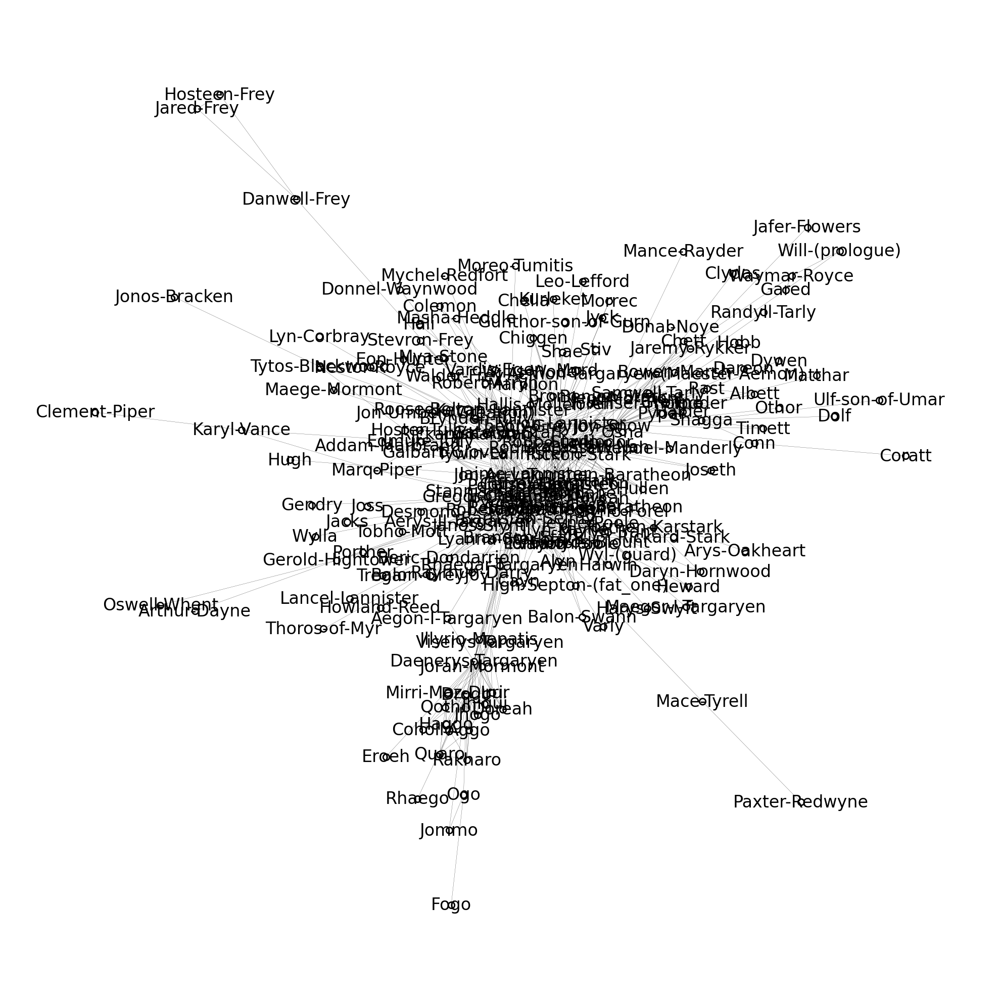

In [18]:
fig, ax = plt.subplots(figsize=(10,10))
nx.draw_networkx(GOT, ax=ax, **common_params)
ax.set_axis_off()
plt.tight_layout()

Let's add some formatting

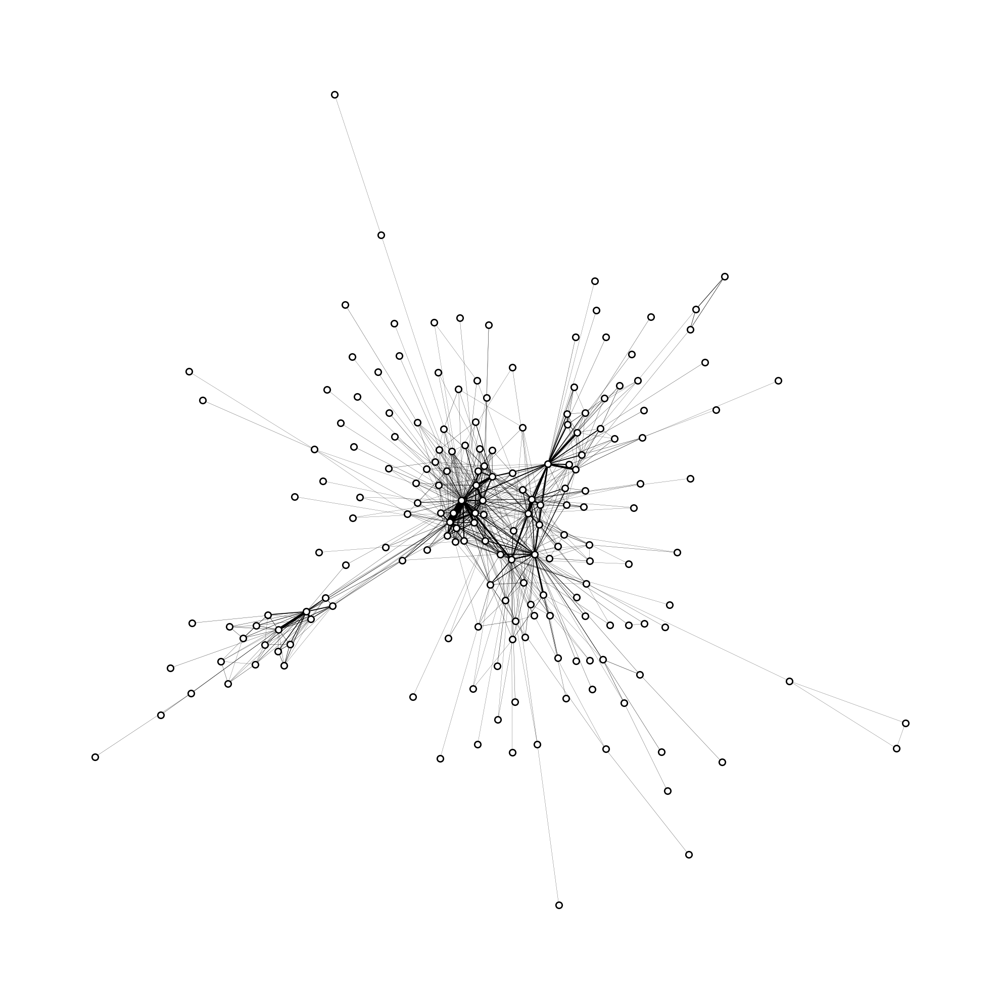

In [19]:
from sklearn.preprocessing import MinMaxScaler

common_node_params = dict(node_size=20, node_color='white', edgecolors='black')

scaler = MinMaxScaler(feature_range=(0.1,5))

weights = weights = [n[2]["weight"] for n in GOT.edges(data=True)]
scaled_weights = scaler.fit_transform([[d] for d in weights]).flatten()

fig, ax = plt.subplots(figsize=(10,10))

pos = nx.spring_layout(GOT, weight="weight", iterations=200)

nx.draw_networkx_nodes(GOT, pos=pos, **common_node_params)
nx.draw_networkx_edges(GOT, pos, width=scaled_weights)

ax.set_axis_off()
plt.tight_layout()

Labels are very difficult to show without interactivity

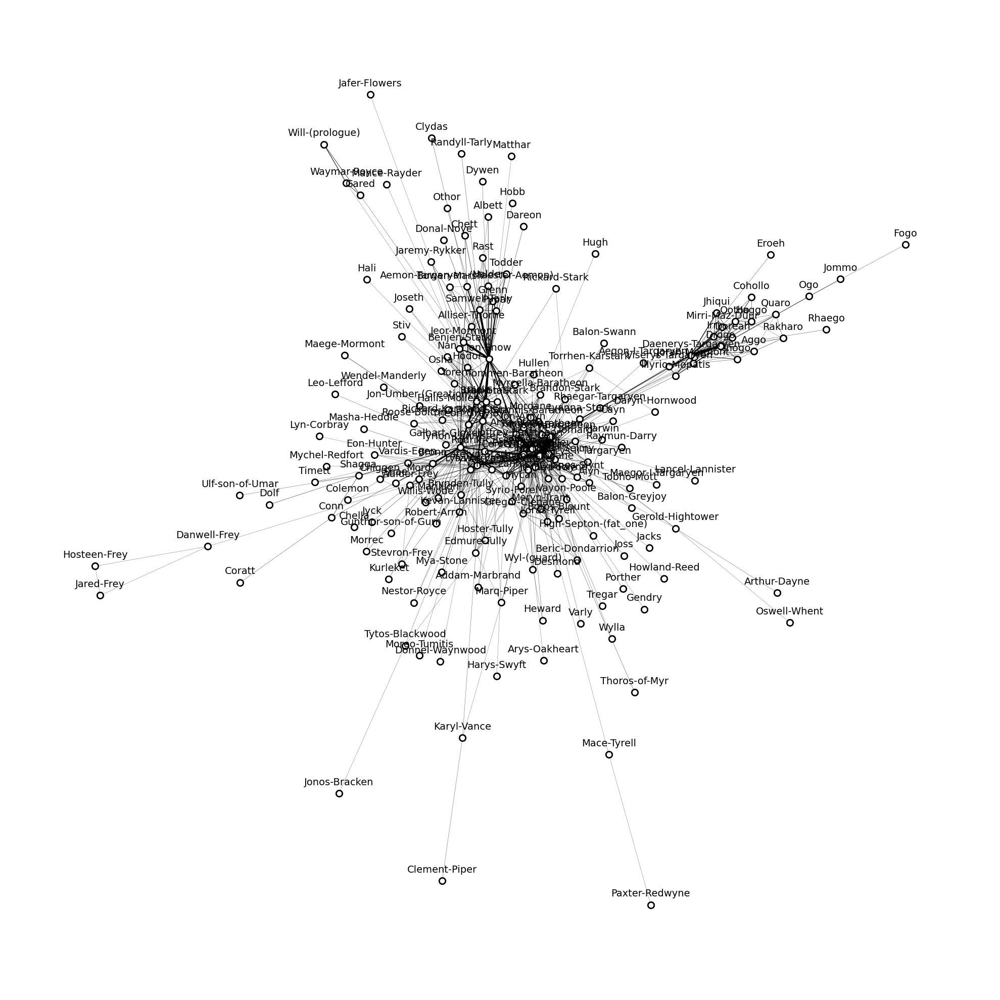

In [20]:
fig, ax = plt.subplots(figsize=(10,10))

pos = nx.spring_layout(GOT, weight="weight", iterations=200)
label_pos = {node: (x, y+0.02) for node, (x, y) in pos.items()}

nx.draw_networkx_nodes(GOT, pos=pos, **common_node_params)
nx.draw_networkx_edges(GOT, pos, width=scaled_weights)
nx.draw_networkx_labels(GOT, label_pos, font_size=7)

ax.set_axis_off()
plt.tight_layout()

Let's explore the community structure

In [21]:
communities = nx.community.louvain_communities(GOT)

# Set node attribute reflecting the community membership
for i, community in enumerate(communities):
    for node in community:
        GOT.nodes[node]['community'] = i

In [22]:
GOT.nodes()["Mord"]["community"]

3

In [23]:
from matplotlib.colors import ListedColormap

# Create a colormap
colors = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
cmap = ListedColormap(colors)

node_colors = [GOT.nodes()[node]["community"] for node in GOT.nodes()]

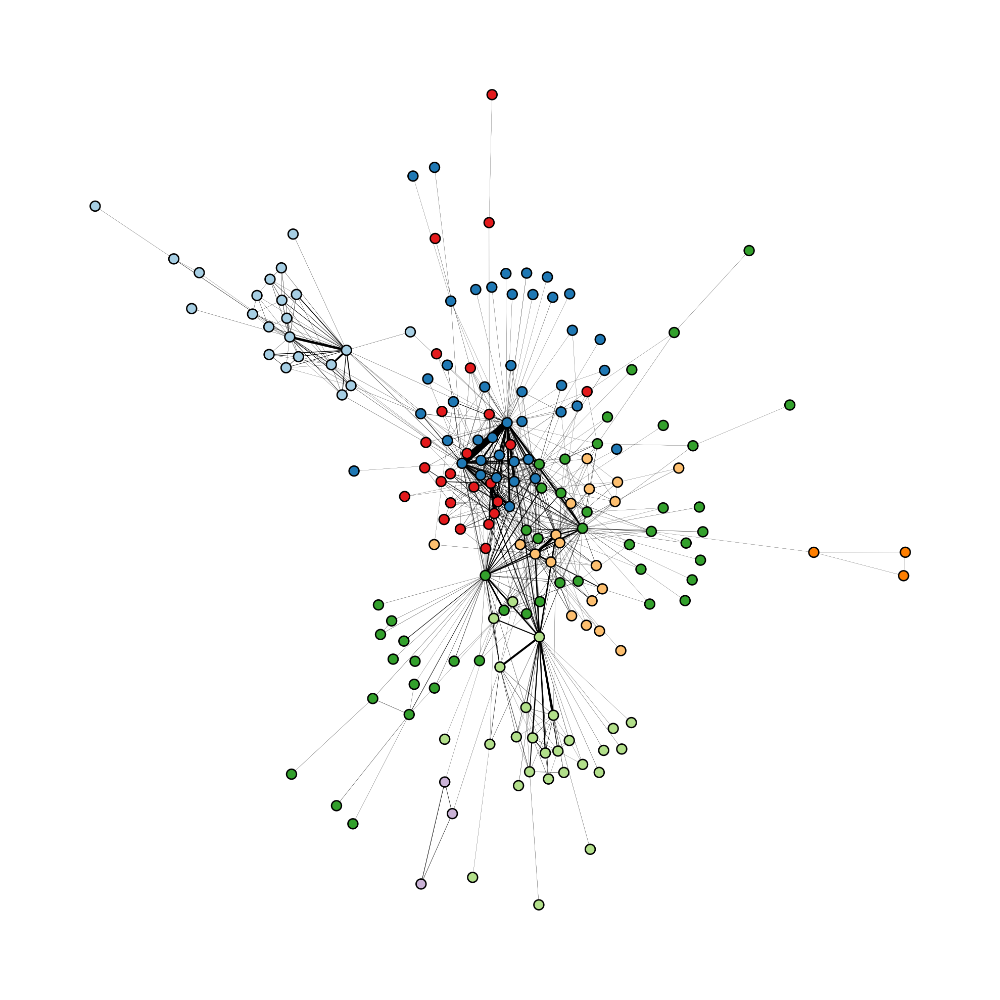

In [24]:
fig, ax = plt.subplots(figsize=(10,10))

pos = nx.spring_layout(GOT, iterations=1000, weight="weigth")

nx.draw_networkx_nodes(GOT, pos=pos, node_color=node_colors, node_size=50, linewidths=1, edgecolors='black',   cmap=cmap)
nx.draw_networkx_edges(GOT, pos, width=scaled_weights)

ax.set_axis_off()
plt.tight_layout()

In [25]:
nx.set_node_attributes(GOT, nx.betweenness_centrality(GOT), name="bc")

In [26]:
# Define a custom data scaler
def scale(arr, minv=50, maxv=200):
    prop_v = np.array(arr)
    scaler = MinMaxScaler(feature_range=(minv,maxv))
    scaled_prop_v = scaler.fit_transform(prop_v.reshape(-1, 1)).flatten()
    return scaled_prop_v

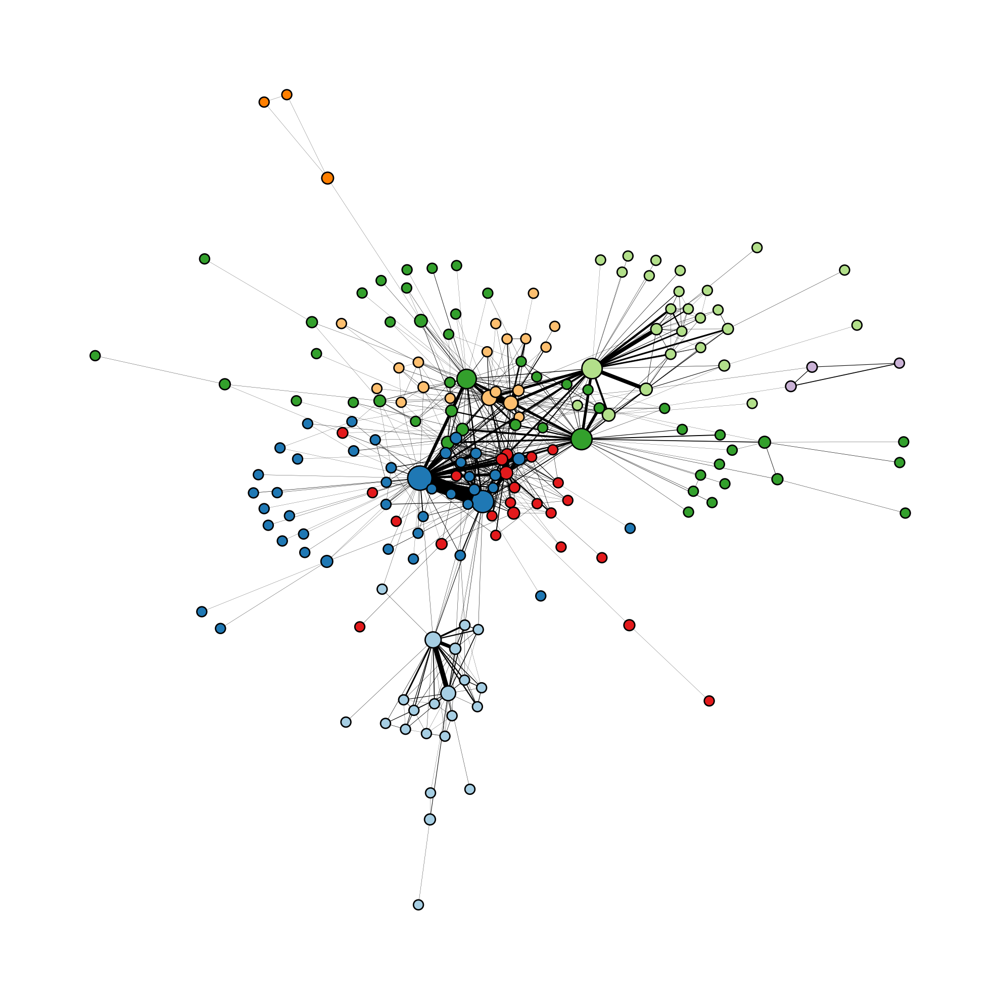

In [27]:
# get betweenness array 
scaled_node_size = scale(list(nx.get_node_attributes(GOT, "bc").values()), minv=50, maxv=300)
scaled_edge_width = scale(list(nx.get_edge_attributes(GOT, "weight").values()), minv=0.1, maxv=10)

fig, ax = plt.subplots(figsize=(10,10))

pos = nx.spring_layout(GOT, iterations=500, weight="weigth")

nx.draw_networkx_nodes(GOT, pos=pos, node_color=node_colors, node_size=scaled_node_size, linewidths=1, edgecolors='black',   cmap=cmap)
nx.draw_networkx_edges(GOT, pos, width=scaled_edge_width)

ax.set_axis_off()
plt.tight_layout()

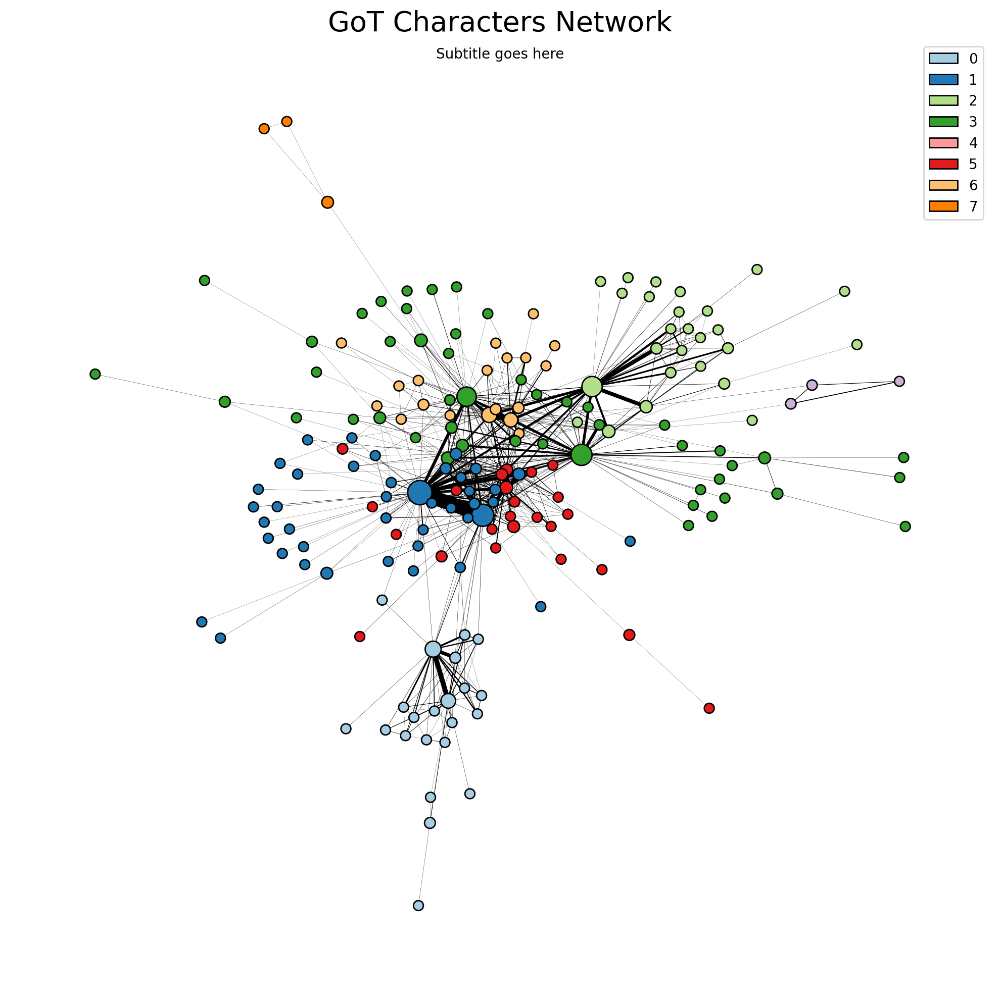

In [28]:
import matplotlib.patches as mpatches

# Assuming communities is your list of communities and colors is your list of colors

# Create a patch for each community
patches = [mpatches.Patch(facecolor=color, label=community, edgecolor='black', linewidth=1) for community, color in zip(range(len(communities)), colors)]

fig, ax = plt.subplots(figsize=(10,10))

nx.draw_networkx_nodes(GOT, pos=pos, node_color=node_colors, node_size=scaled_node_size, linewidths=1, edgecolors='black',   cmap=cmap)
nx.draw_networkx_edges(GOT, pos, width=scaled_edge_width)

ax.set_axis_off()
ax.set_title("GoT Characters Network", fontsize=20)
ax.text(x=0.5, y=0.98, s='Subtitle goes here', fontsize=10, ha='center', transform=ax.transAxes)
plt.legend(handles=patches)
plt.tight_layout()

Compose the plots stage creating your narrative

In [29]:
interactions_per_character = df.groupby('Source')['Target'].count()

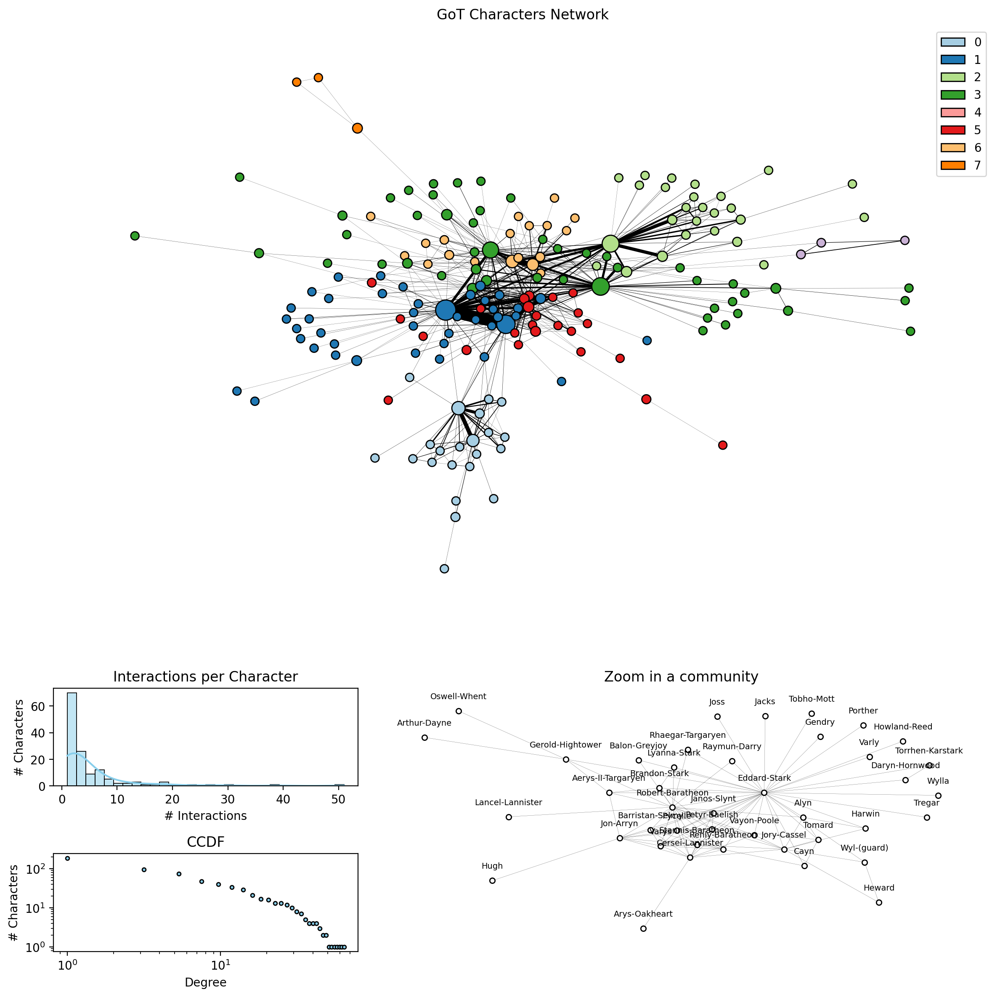

In [30]:
import seaborn as sns

# Create a figure
fig = plt.figure(figsize=(12,12))

# Create the first subplot that takes the entire first line
ax1 = plt.subplot2grid((6, 6), (0, 0), colspan=6, rowspan=4)

# Create the second and third subplots in the second line
ax2 = plt.subplot2grid((6, 6), (4, 0), colspan=2, rowspan=1)
ax3 = plt.subplot2grid((6, 6), (4, 2), colspan=4, rowspan=2)
ax4 = plt.subplot2grid((6, 6), (5, 0), colspan=2, rowspan=1)

# Main network
nx.draw_networkx_nodes(GOT, pos, node_color=node_colors, node_size=scaled_node_size, linewidths=1, edgecolors='black',   cmap=cmap, ax=ax1)
nx.draw_networkx_edges(GOT, pos, width=scaled_edge_width, ax=ax1)

ax1.set_axis_off()
ax1.set_title("GoT Characters Network", fontsize=12)
ax1.legend(handles=patches)

# Distribution of Interactions per Character
sns.histplot(interactions_per_character, bins=30, color='skyblue', edgecolor='black', kde=True, ax=ax2)
ax2.set_title('Interactions per Character', fontsize=12)
ax2.set_xlabel('# Interactions', fontsize=10)
ax2.set_ylabel('# Characters', fontsize=10)

# A zoom in a particular community
GOT_sub = GOT.subgraph(communities[1])
pos_sub = nx.spring_layout(GOT_sub, iterations=500, weight="weigth")
label_pos = {node: (x, y+0.1) for node, (x, y) in pos_sub.items()}

nx.draw_networkx_nodes(GOT_sub, pos_sub, ax=ax3, **common_node_params)
nx.draw_networkx_edges(GOT_sub, pos_sub, width=0.1, ax=ax3)
nx.draw_networkx_labels(GOT_sub, label_pos, ax=ax3, font_size=7)

ax3.set_axis_off()
ax3.set_title("Zoom in a community", fontsize=12)


# Get the degree of each node
degrees = [degree for node, degree in GOT.degree()]

# Calculate the complementary cumulative distribution
counts, bin_edges = np.histogram(degrees, bins=30)
cum_counts = np.cumsum(counts[::-1])[::-1]
bin_edges = bin_edges[:-1]

# Plot the complementary cumulative distribution in a log-log scale
ax4.scatter(bin_edges, cum_counts, s=10,  color="skyblue", edgecolor='black')
ax4.set_xscale('log')
ax4.set_yscale('log')
ax4.set_title('CCDF', fontsize=12)
ax4.set_xlabel('Degree', fontsize=10)
ax4.set_ylabel('# Characters', fontsize=10)


plt.tight_layout()

In [31]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

# Specify the name of the city
city = "Chivasso, IT"

# Create a graph from the OpenStreetMap data
G = ox.graph_from_place(city, network_type='walk')

# Convert the graph into a NetworkX graph
G_nx = nx.relabel.convert_node_labels_to_integers(G)

In [32]:
next(iter(G.nodes(data=True)))

(249377986, {'y': 45.1858741, 'x': 7.8604036, 'street_count': 3})

In [33]:
next(iter(G.edges(data=True)))

(249377986,
 262300336,
 {'osmid': 23100161,
  'oneway': False,
  'highway': 'trunk_link',
  'maxspeed': '40',
  'reversed': True,
  'length': 197.05999999999997,
  'geometry': <LINESTRING (7.86 45.186, 7.86 45.186, 7.86 45.185, 7.86 45.185, 7.86 45.185...>})

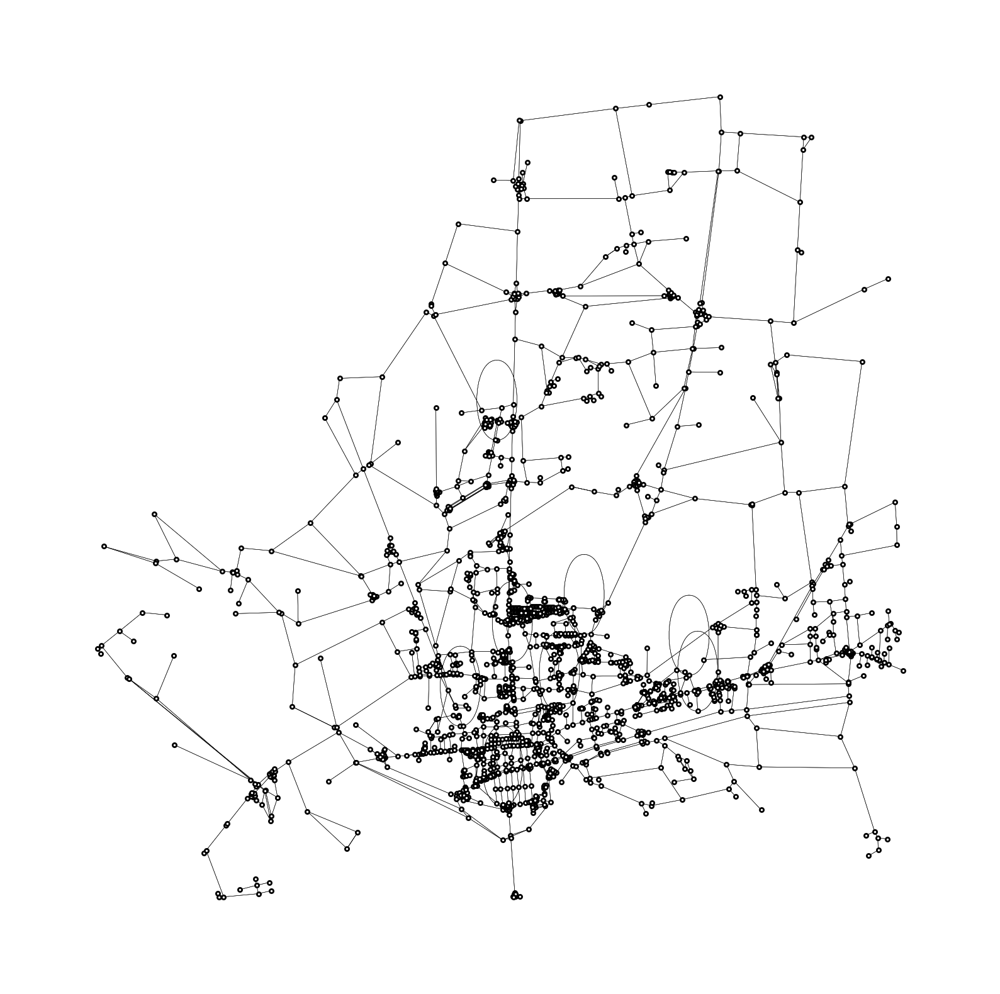

In [34]:
x = list(nx.get_node_attributes(G_nx, 'x').values())
y = list(nx.get_node_attributes(G_nx, 'y').values())
pos = np.vstack((x, y)).T

fig, ax = plt.subplots(figsize=(10,10))
ax.set_axis_off()

nx.draw_networkx_nodes(G_nx, pos, node_size=5, node_color='white', edgecolors='black', ax=ax)
nx.draw_networkx_edges(G_nx, pos, width=0.2, arrows=False, ax=ax)

The previous methid does not consider that a street segment is a LineString that could be not a straight line

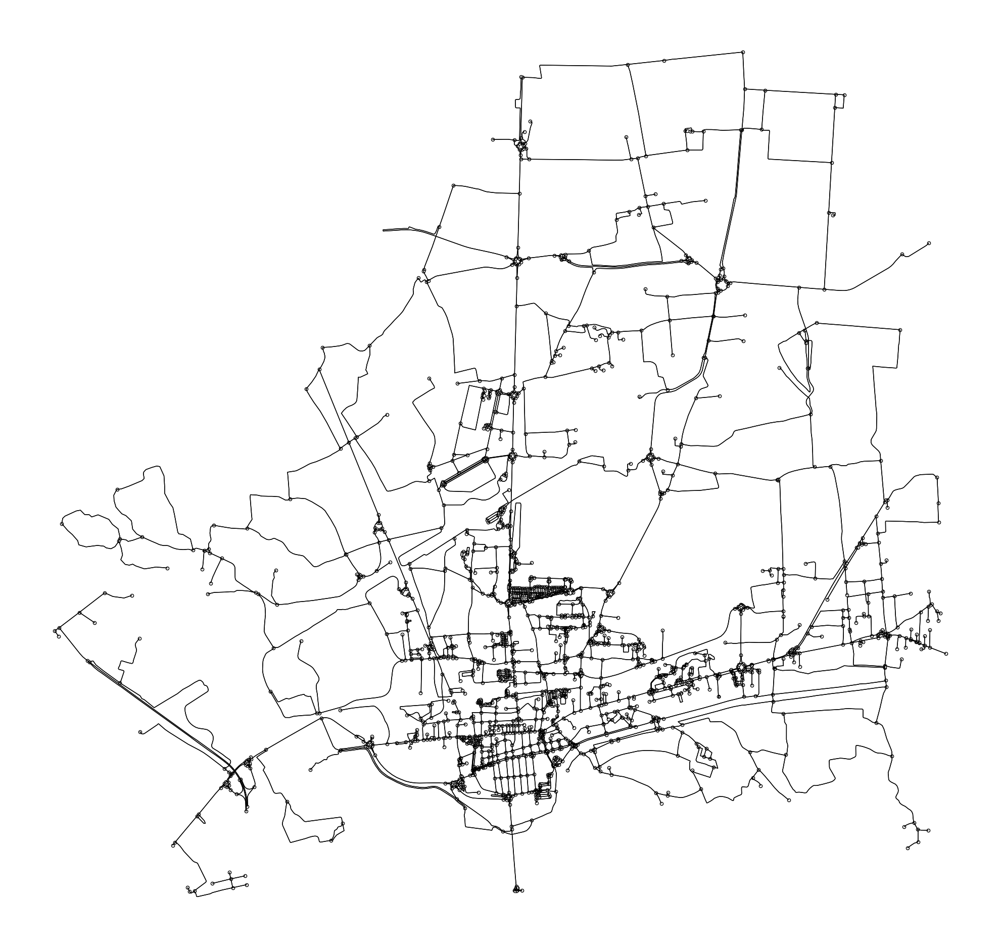

In [35]:
# Convert the graph into a GeoDataFrame
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

# Plot the GeoDataFrame
fig, ax = plt.subplots(figsize=(10,10))
gdf_edges.plot(ax=ax, linewidth=0.5, edgecolor='black')
gdf_nodes.plot(ax=ax, markersize=5, facecolor="white", edgecolor='black', linewidth=0.5)
ax.axes.set_axis_off()
plt.tight_layout()

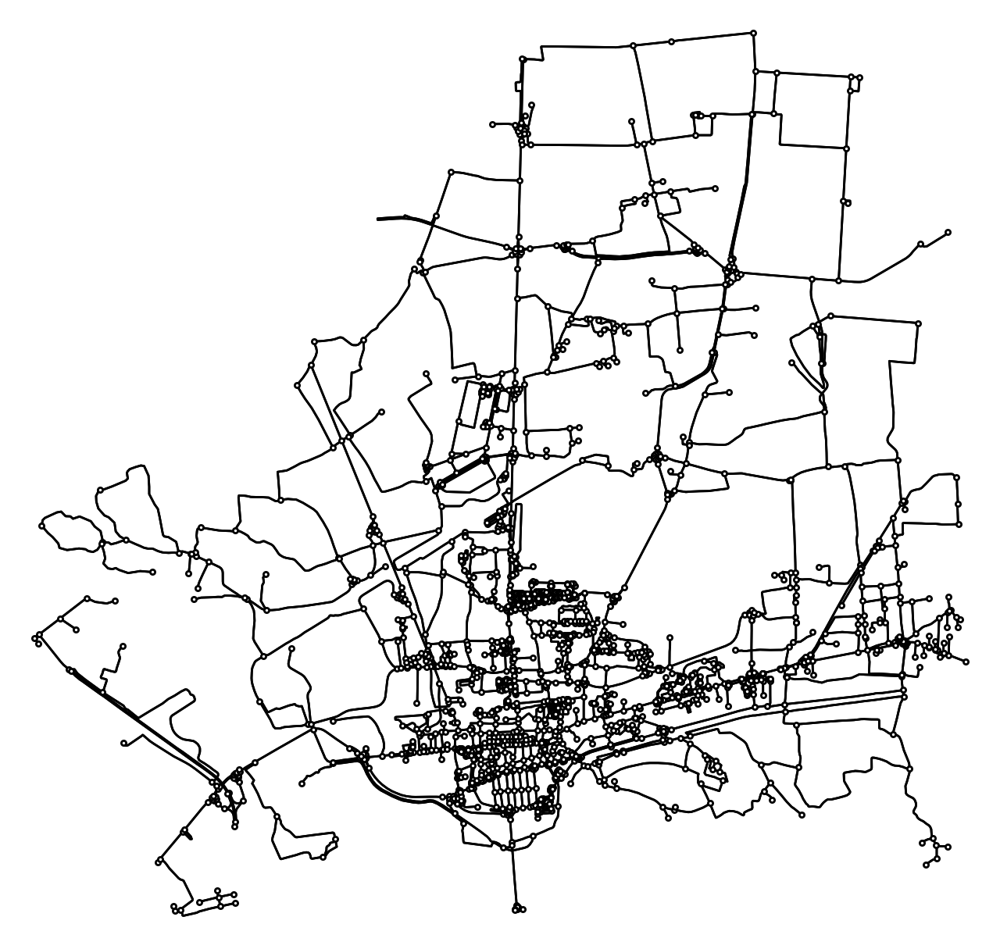

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [36]:
ox.plot_graph(G, bgcolor="white", edge_color="black", edge_alpha=1.0, node_color="white", node_edgecolor="black", node_size=5)